# Zadanie domowe

W przypadku obrazów w odcieniach szarości pojedynczy piksel z zakresu [0; 255] reprezentowany jest jako 8-bitowa liczba bez znaku.
Pewnym rozszerzeniem analizy sposobu reprezentacji obrazu może być następujący eksperyment.
Załóżmy, że z każdego z 8 bitów możemy stworzyć pojedynczy obraz binarny (ang. _bit-plane slicing_).
Dla obrazka _100zloty.jpg_ (https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/100zloty.jpg) stwórz 8 obrazów, z których każdy powinien zawierać jedną płaszczyznę bitową.
Podpowiedź $-$ warto sprawdzić, jak realizuje się bitowe operacje logiczne.
Zastosowanie takiej dekompozycji obrazu pozwala na analizę ,,ważności'' poszczególnych bitów.
Jest to użyteczne w kwantyzacji, ale także w kompresji.

W drugim etapie zadania proszę spróbować odtworzyć obraz oryginalny z mniejszej liczby obrazów binarnych.
Warto zacząć od dwóch najbardziej znaczących bitów, a później dodawać kolejne.
Należy utworzyć co najmniej trzy wersje zrekonstruowanych obrazów.
Podpowiedź $-$ rekonstrukcja obrazu to mnożenie przez odpowiednią potęgę liczby 2 (przesunięcie bitowe) oraz dodawanie.

In [13]:
import cv2
import os
import requests
import matplotlib.pyplot as plt
import  numpy as np

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/'
fileName = '100zloty.jpg'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

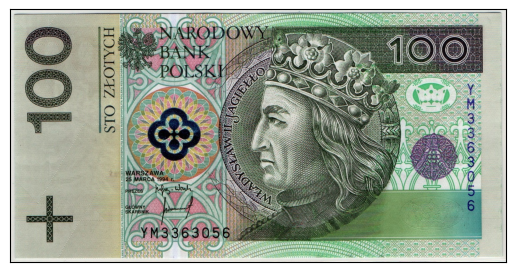

In [16]:
im_gray_1 = cv2.imread("100zloty.jpg")

plt.imshow(im_gray_1)
plt.xticks([])
plt.yticks([])
plt.show()

In [14]:
def handle_pixel(px, n):
    r,g,b = px
    r = ((r // 2**n)%2) * 2**n
    g = ((g // 2**n)%2) * 2**n
    b = ((b // 2**n)%2) * 2**n
    return np.array([r, g, b])

def extract_bit(image, n):
    return [[handle_pixel(i, n) for i in j] for j in image]



[0 0 4]


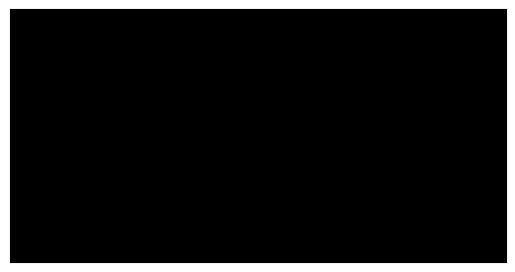

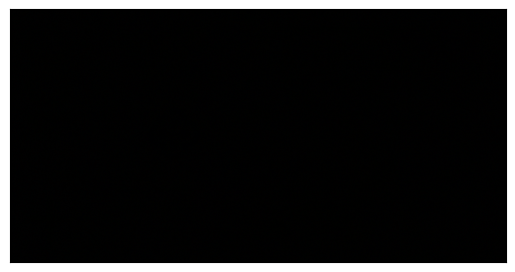

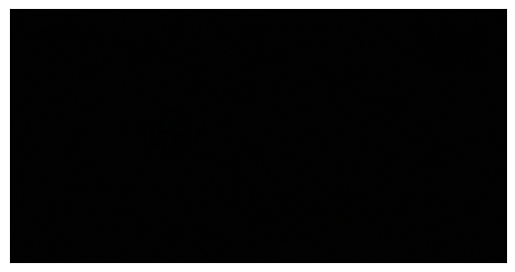

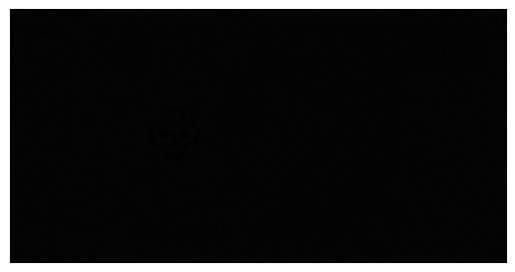

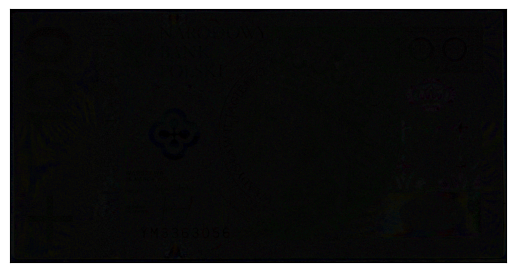

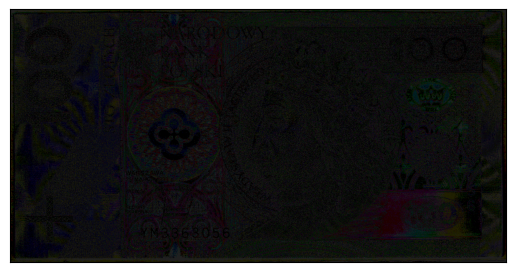

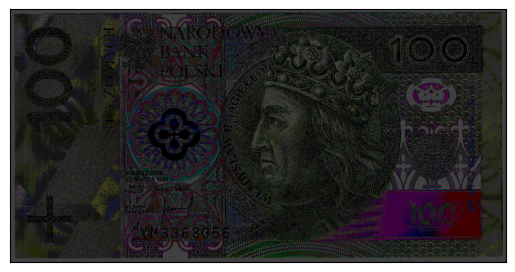

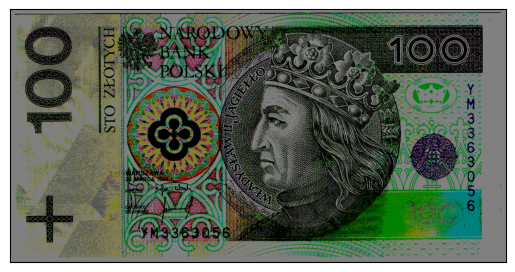

In [18]:
decomposed = []
for i in range(8):
    im_gray_1 = cv2.imread("100zloty.jpg")
    im_gray_1 = extract_bit(im_gray_1, i)
    decomposed.append(im_gray_1)
    plt.imshow(im_gray_1)
    plt.xticks([])
    plt.yticks([])
    plt.show()


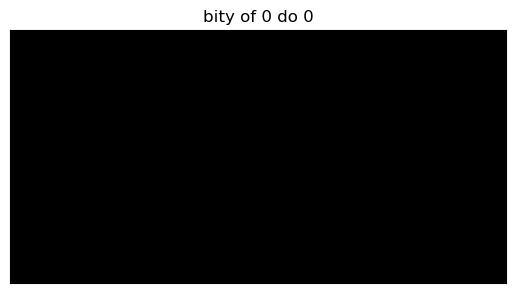

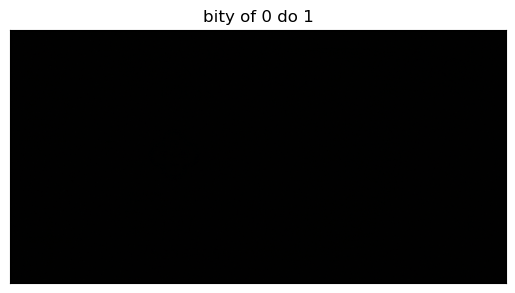

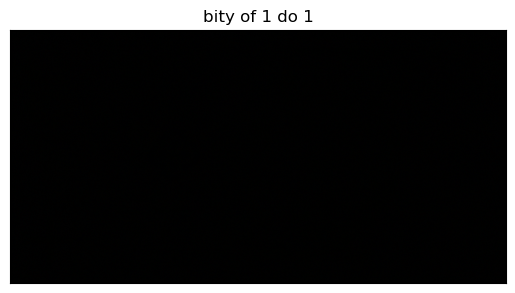

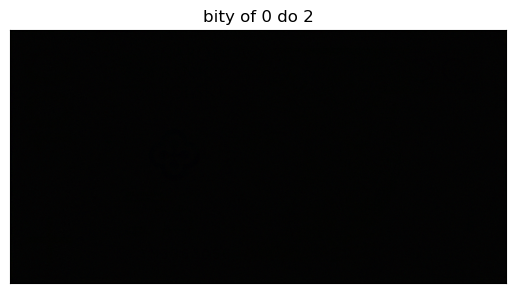

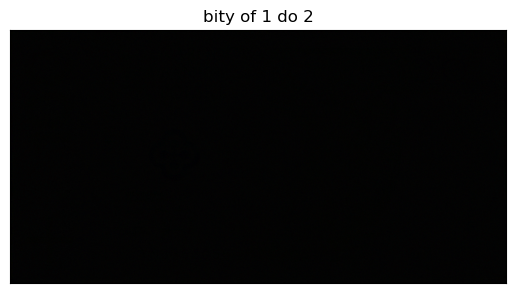

...

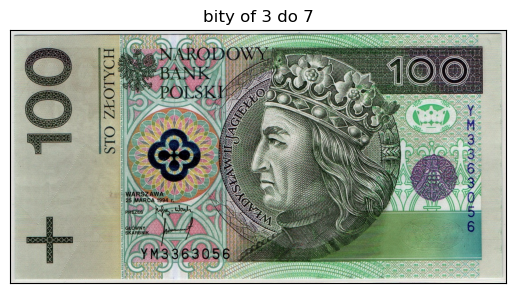

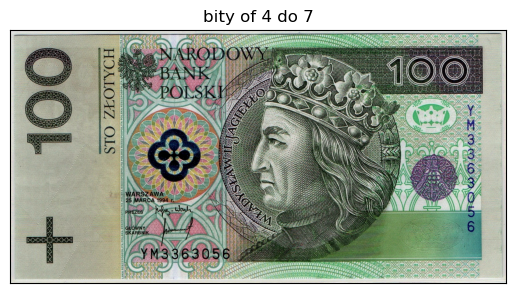

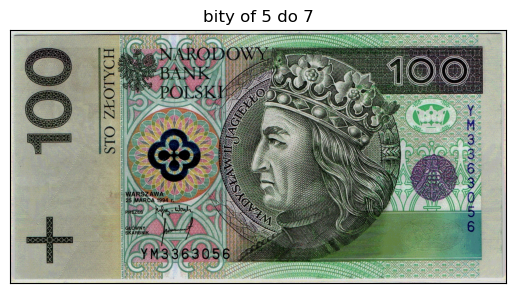

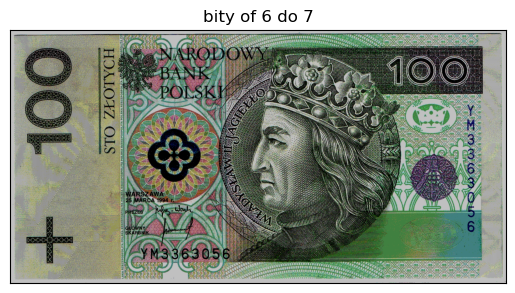

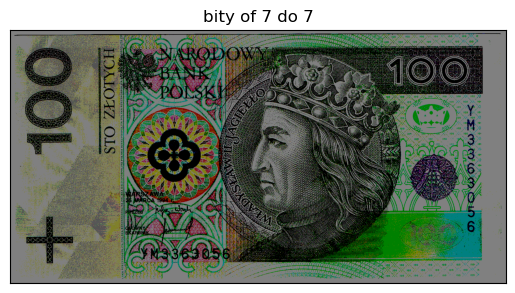

In [22]:

def reconstruct(decomposed, _from, _to):
  return np.sum(decomposed[_from:_to + 1], axis=0)

# for i in range(8):
#   for j in range(i + 1):
#     render_image(, title=f"Od {j + 1}. do {i + 1}. bitu")

for i in range(8):
    for j in range(i+1):
        im_gray_1 = reconstruct(decomposed, j, i)
        plt.imshow(im_gray_1)
        plt.xticks([])
        plt.yticks([])
        plt.title(f"bity of {j} do {i}")
        plt.show()